In [1]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
import cv2 
import os

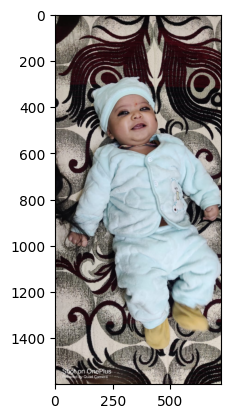

In [2]:
img = image.load_img(r"C:\Users\LENOVO\Desktop\Full stack data science class\60. 14th Jan - CNN Practical - Sentiment_classification_CNN\CNN - happy & sad\training\happy\15.jpg")
plt.imshow(img)

In [3]:
i1 = cv2.imread(r"C:\Users\LENOVO\Desktop\Full stack data science class\60. 14th Jan - CNN Practical - Sentiment_classification_CNN\CNN - happy & sad\training\happy\15.jpg")
i1

array([[[ 67,  81,  93],
        [ 42,  56,  68],
        [ 40,  56,  68],
        ...,
        [178, 190, 202],
        [178, 192, 204],
        [174, 188, 200]],

       [[126, 140, 152],
        [ 84,  98, 110],
        [ 48,  64,  76],
        ...,
        [173, 185, 197],
        [172, 186, 198],
        [168, 182, 194]],

       [[140, 155, 164],
        [108, 123, 132],
        [ 79,  94, 103],
        ...,
        [171, 183, 193],
        [171, 185, 197],
        [168, 182, 194]],

       ...,

       [[ 34,  40,  53],
        [ 21,  27,  40],
        [ 14,  20,  33],
        ...,
        [194, 210, 216],
        [196, 212, 218],
        [196, 212, 218]],

       [[  7,  12,  27],
        [  0,   4,  19],
        [  0,   0,  15],
        ...,
        [191, 208, 211],
        [193, 210, 213],
        [194, 211, 214]],

       [[ 15,  20,  35],
        [ 16,  21,  36],
        [ 15,  20,  35],
        ...,
        [189, 206, 209],
        [190, 207, 210],
        [191, 208, 211]]

In [4]:
i1.shape

(1600, 720, 3)

In [5]:
train = ImageDataGenerator(rescale = 1/255)
validation = ImageDataGenerator(rescale = 1/255)

In [6]:
train_dataset = train.flow_from_directory(r"C:\Users\LENOVO\Desktop\Full stack data science class\60. 14th Jan - CNN Practical - Sentiment_classification_CNN\CNN - happy & sad\training",
                                          target_size = (200,200),
                                          batch_size = 3,
                                          class_mode = 'binary')
validation_dataset = validation.flow_from_directory(r"C:\Users\LENOVO\Desktop\Full stack data science class\60. 14th Jan - CNN Practical - Sentiment_classification_CNN\CNN - happy & sad\validation",
                                                     target_size = (200,200),
                                                     batch_size = 3,
                                                     class_mode = 'binary')

Found 26 images belonging to 2 classes.
Found 0 images belonging to 2 classes.


In [7]:
train_dataset.class_indices

{'happy': 0, 'sad': 1}

In [8]:
train_dataset.classes

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1])

In [11]:
model = tf.keras.models.Sequential([ tf.keras.layers.Conv2D(16,(3,3),activation = 'relu',input_shape = (200,200,3)),
                                    tf.keras.layers.MaxPool2D(2,2), #3 filtr we applied hear
                                    #
                                    tf.keras.layers.Conv2D(32,(3,3),activation = 'relu'),
                                    tf.keras.layers.MaxPool2D(2,2),    
                                    #                       
                                    tf.keras.layers.Conv2D(64,(3,3),activation = 'relu'),
                                    tf.keras.layers.MaxPool2D(2,2), 
                                    ##
                                    tf.keras.layers.Flatten(),
                                    ##
                                    tf.keras.layers.Dense(512, activation = 'relu'),
                                    #
                                    tf.keras.layers.Dense(1,activation= 'sigmoid')
                                    ]
                                    )                 

In [12]:
model.compile(loss= 'binary_crossentropy',optimizer = tf.keras.optimizers.RMSprop(lr=0.001),metrics=['accuracy'])

In [13]:
model_fit = model.fit(train_dataset, steps_per_epoch = 3, epochs = 10, validation_data = validation_dataset)

Epoch 1/10
3/3 [==============================] - 5s 624ms/step - loss: 8.4002 - accuracy: 0.3333
Epoch 2/10
3/3 [==============================] - 2s 519ms/step - loss: 0.8674 - accuracy: 0.4444
Epoch 3/10
3/3 [==============================] - 2s 541ms/step - loss: 0.8137 - accuracy: 0.5556
Epoch 4/10
3/3 [==============================] - 2s 606ms/step - loss: 0.6079 - accuracy: 0.6667
Epoch 5/10
3/3 [==============================] - 2s 567ms/step - loss: 0.5365 - accuracy: 0.8750
Epoch 6/10
3/3 [==============================] - 2s 507ms/step - loss: 0.6907 - accuracy: 0.7778
Epoch 7/10
3/3 [==============================] - 2s 516ms/step - loss: 0.4969 - accuracy: 0.7500
Epoch 8/10
3/3 [==============================] - 2s 544ms/step - loss: 0.5252 - accuracy: 0.8750
Epoch 9/10
3/3 [==============================] - 2s 554ms/step - loss: 0.9318 - accuracy: 0.3333
Epoch 10/10
3/3 [==============================] - 1s 496ms/step - loss: 0.5211 - accuracy: 0.6667


In [14]:
dir_path = r"C:\Users\LENOVO\Desktop\Full stack data science class\60. 14th Jan - CNN Practical - Sentiment_classification_CNN\CNN - happy & sad\testing"
for i in os.listdir(dir_path):
    print(i)

1.jpg
10.jpg
11.jpg
12.jpg
13.jpg
14.jpg
15.jpg
16.jpg
2.jpg
3.jpg
4.jpg
5.jpg
6.jpg
7.jpg
8.jpg
9.jpg
download (2).jpg
images (1).jpg
images (2).jpg
images (3).jpg
images (4).jpg
images (5).jpg
images (6).jpg
images (7).jpg
images (8).jpg
images.jpg


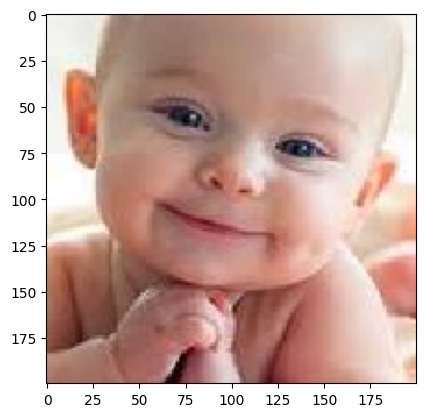

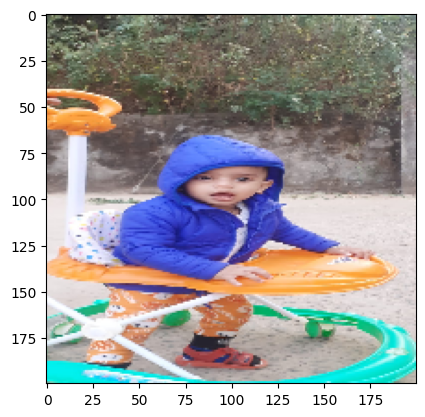

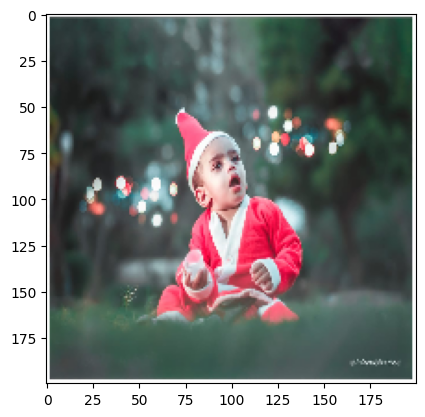

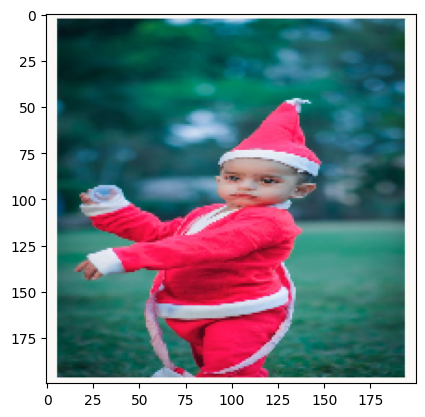

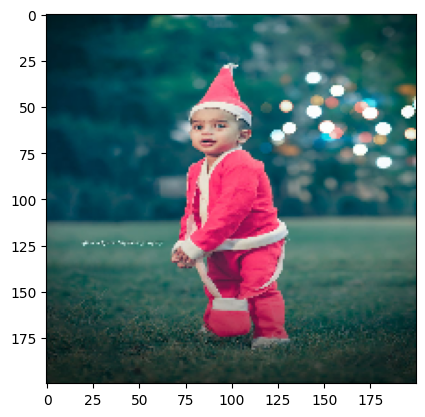

...

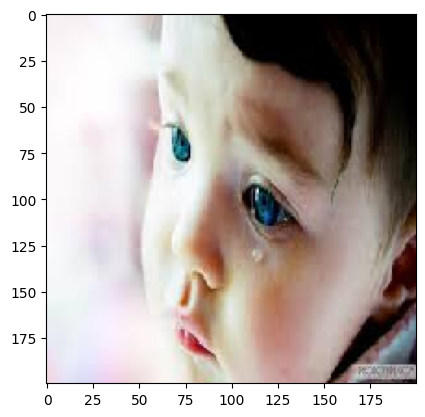

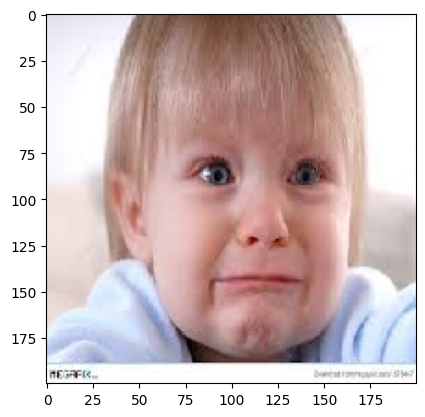

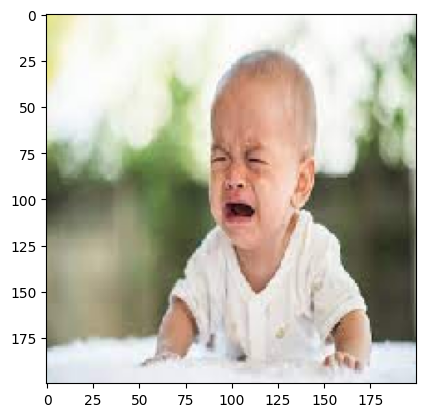

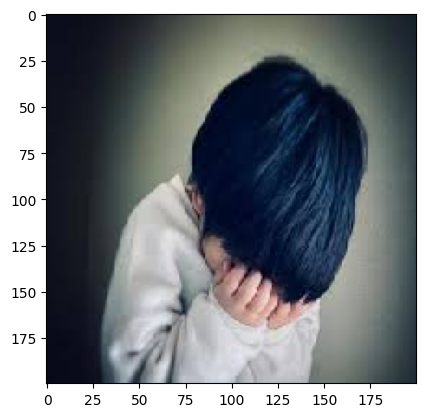

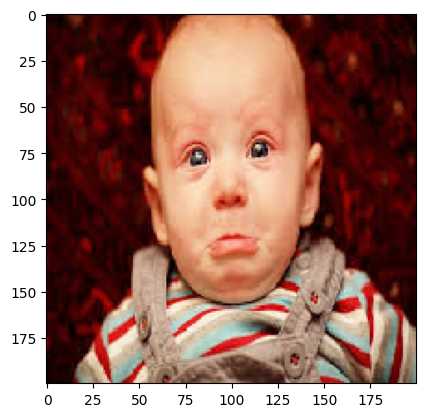

In [15]:
dir_path = r"C:\Users\LENOVO\Desktop\Full stack data science class\60. 14th Jan - CNN Practical - Sentiment_classification_CNN\CNN - happy & sad\testing"
for i in os.listdir(dir_path):
    img = image.load_img(dir_path+ '//'+i, target_size = (200,200))
    plt.imshow(img)
    plt.show()   

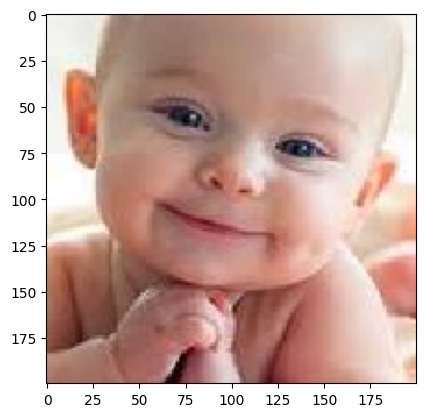

1/1 [==============================] - 0s 48ms/step
i am happy


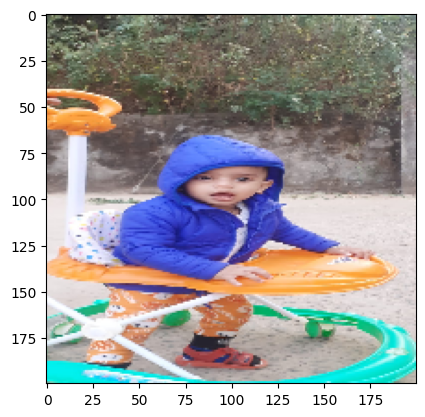

1/1 [==============================] - 0s 31ms/step
i am happy


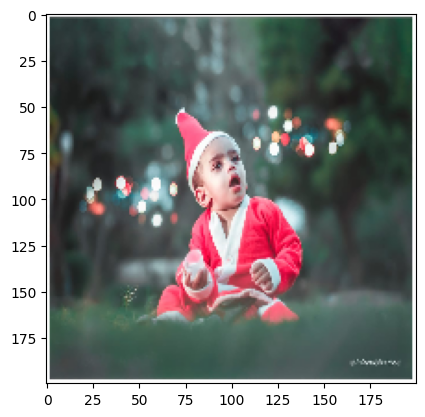

1/1 [==============================] - 0s 31ms/step
i am happy


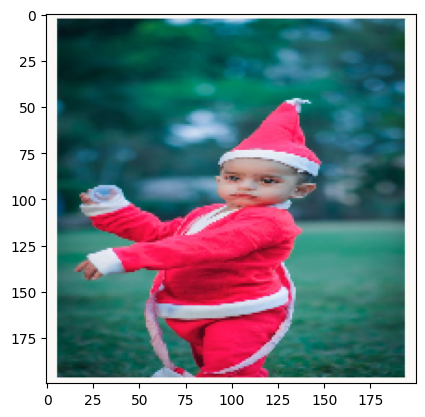

1/1 [==============================] - 0s 31ms/step
i am happy


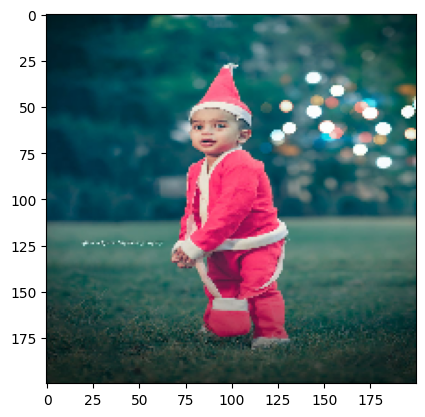

1/1 [==============================] - 0s 31ms/step
i am happy


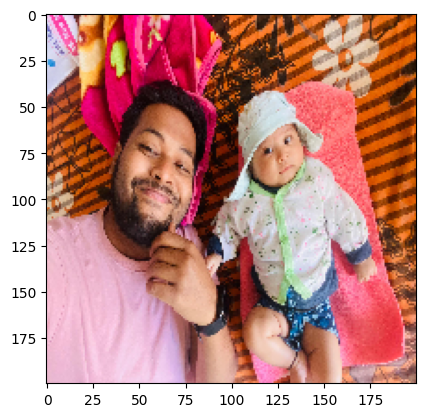

1/1 [==============================] - 0s 86ms/step
i am happy


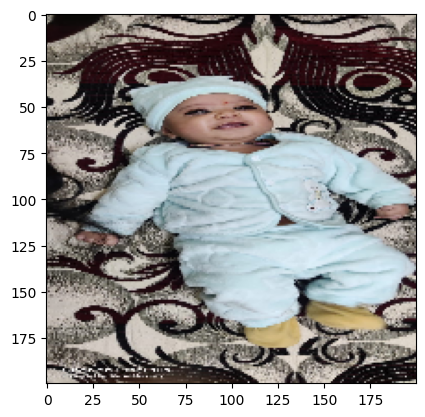

1/1 [==============================] - 0s 49ms/step
i am happy


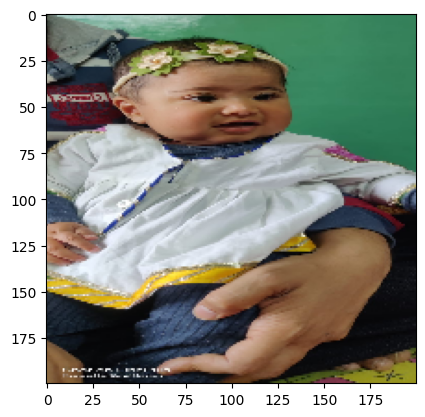

1/1 [==============================] - 0s 47ms/step
i am happy


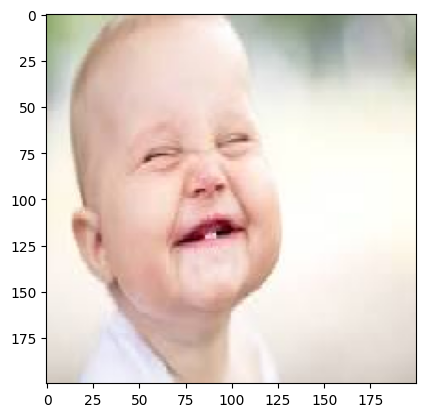

1/1 [==============================] - 0s 31ms/step
i am sad


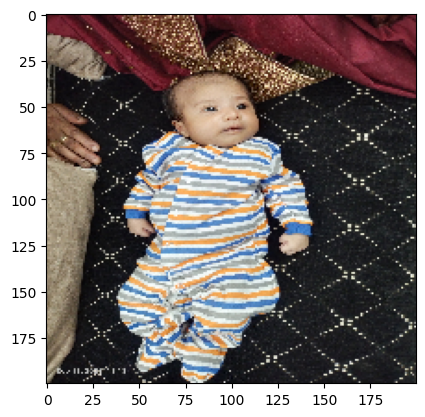

1/1 [==============================] - 0s 33ms/step
i am happy


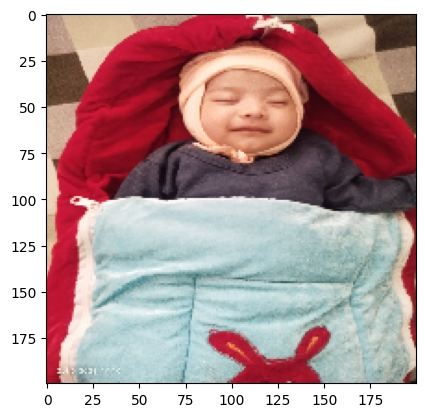

1/1 [==============================] - 0s 51ms/step
i am happy


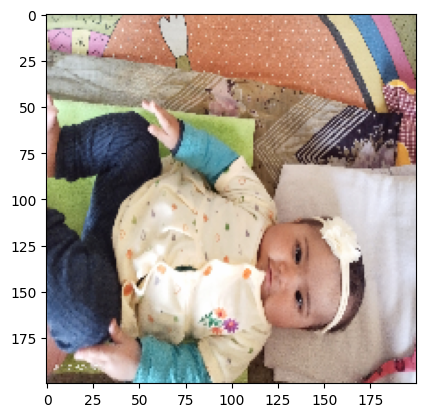

1/1 [==============================] - 0s 100ms/step
i am happy


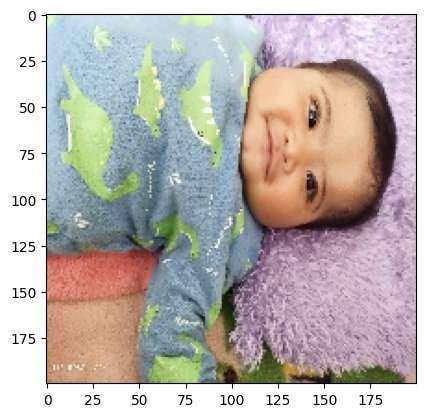

1/1 [==============================] - 0s 32ms/step
i am happy


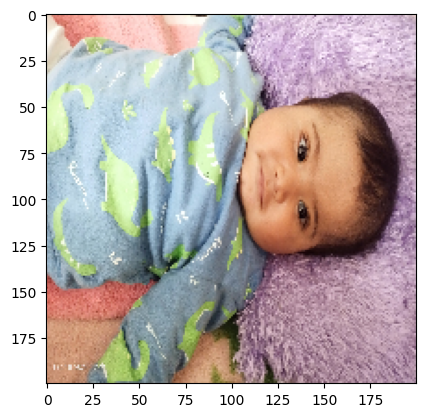

1/1 [==============================] - 0s 34ms/step
i am happy


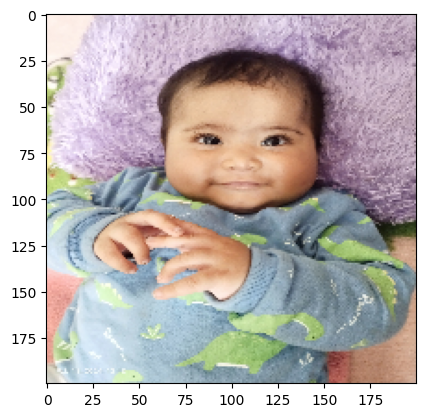

1/1 [==============================] - 0s 31ms/step
i am happy


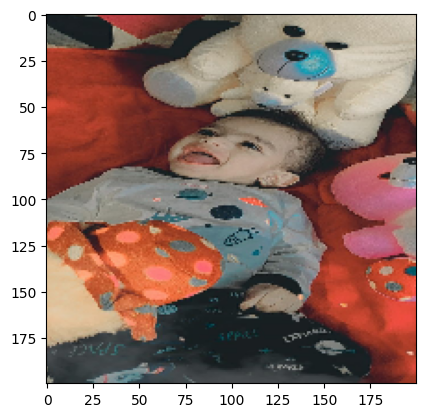

1/1 [==============================] - 0s 31ms/step
i am happy


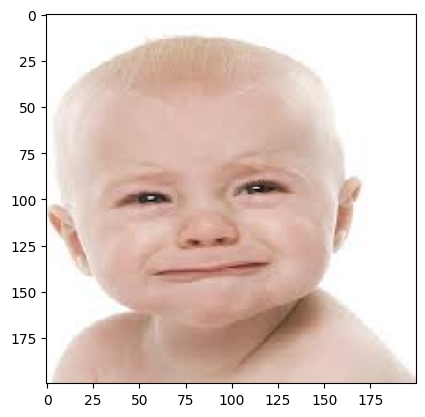

1/1 [==============================] - 0s 31ms/step
i am sad


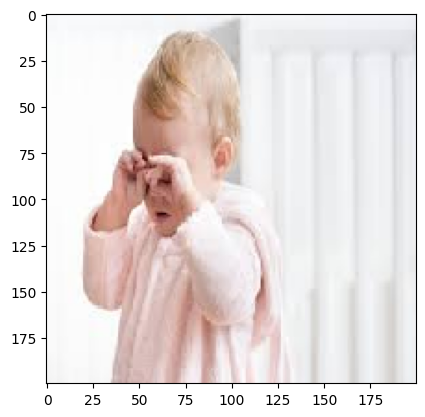

1/1 [==============================] - 0s 46ms/step
i am sad


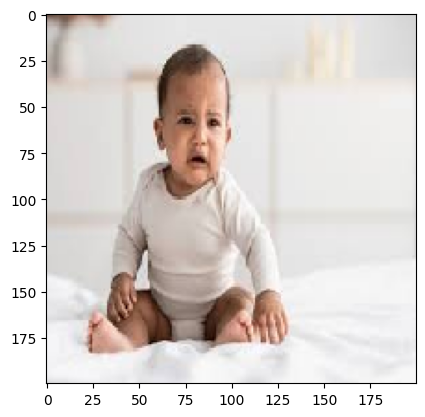

1/1 [==============================] - 0s 67ms/step
i am sad


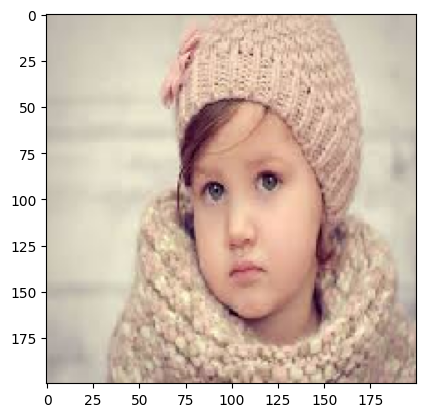

1/1 [==============================] - 0s 49ms/step
i am sad


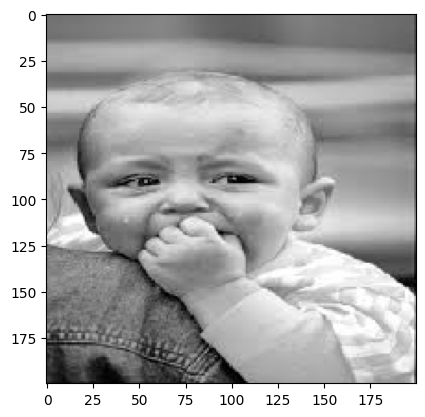

1/1 [==============================] - 0s 33ms/step
i am sad


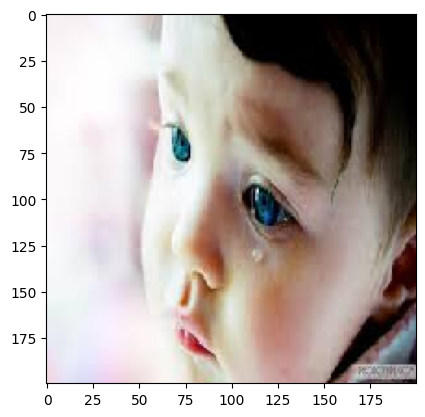

1/1 [==============================] - 0s 34ms/step
i am sad


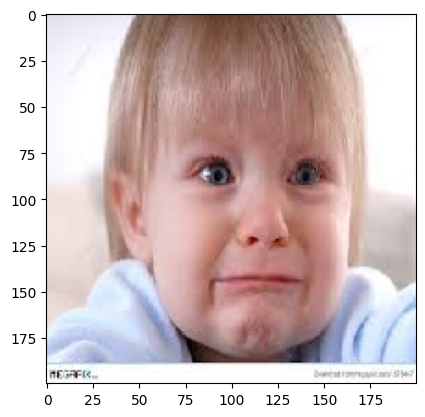

1/1 [==============================] - 0s 27ms/step
i am sad


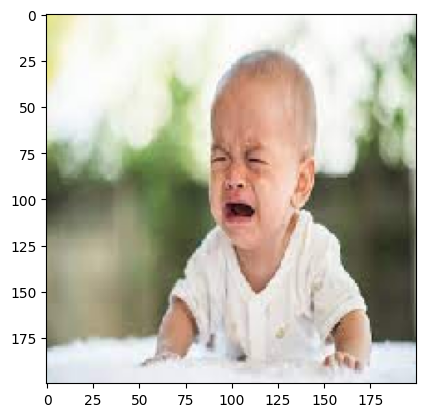

1/1 [==============================] - 0s 31ms/step
i am sad


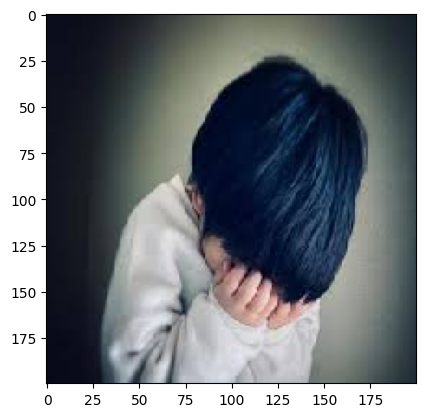

1/1 [==============================] - 0s 31ms/step
i am sad


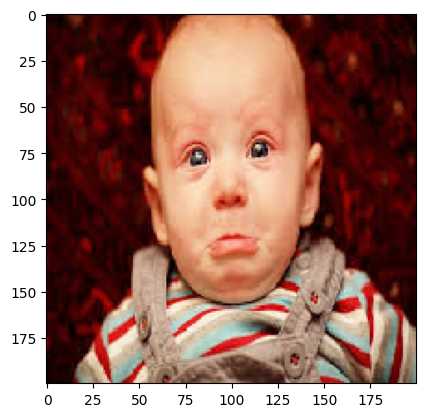

1/1 [==============================] - 0s 47ms/step
i am sad


In [18]:
dir_path = r"C:\Users\LENOVO\Desktop\Full stack data science class\60. 14th Jan - CNN Practical - Sentiment_classification_CNN\CNN - happy & sad\testing"
for i in os.listdir(dir_path):
    img = image.load_img(dir_path+ '//'+i, target_size = (200,200))
    plt.imshow(img)
    plt.show()
        
    x= image.img_to_array(img)
    x=np.expand_dims(x,axis = 0)
    images = np.vstack([x])
    
    val = model.predict(images)
    if val == 0:
        print( 'i am happy')
    else:
        print('i am sad')